In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from augraphy import *

In [2]:
## 시각화 함수
def visualize(image, result):
    plt.figure(figsize=(10, 10))

    plt.subplot(2, 2, 1)
    plt.imshow(image)
    plt.title('Before')

    plt.subplot(2, 2, 2)
    plt.imshow(result)
    plt.title('After')

    plt.subplot(2, 2, 3)
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='black', alpha=0.5)
    plt.title('Before')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

    plt.subplot(2, 2, 4)
    plt.hist(result.ravel(), bins=256, range=[0, 256], color='black', alpha=0.5)
    plt.title('After')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

    plt.show()

In [3]:
# image = np.full((700, 1500,3), 255, dtype="uint8")
# text = "Lorem ipsum dolor sit amet, consectetur adipiscing elit"
# image = cv2.putText(image, text, (80, 350), cv2.FONT_HERSHEY_SIMPLEX, 1.5, 0, 3)

image = cv2.imread("../dataset/train/0a4adccbb7fe73e0.jpg")

# Paper

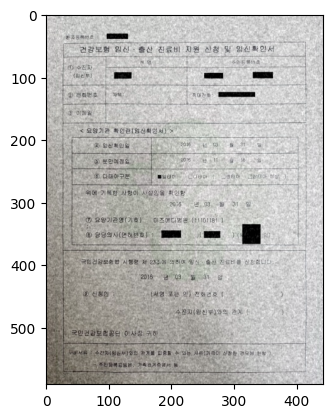

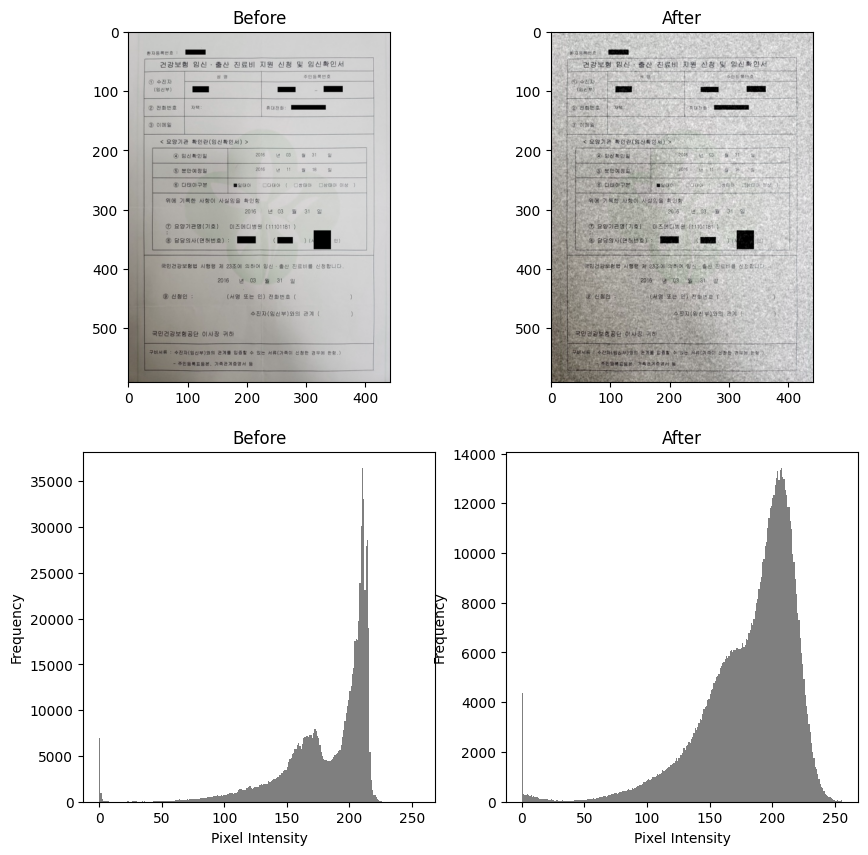

In [66]:
noise_texturize = NoiseTexturize(sigma_range=(6, 10),
                                 turbulence_range=(5, 10),
                                 texture_width_range=(50, 500),
                                 texture_height_range=(50, 500))

img_noise_texturize = noise_texturize(image)
plt.imshow(img_noise_texturize)
visualize(image, img_noise_texturize)

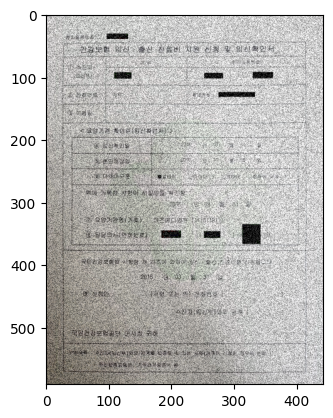

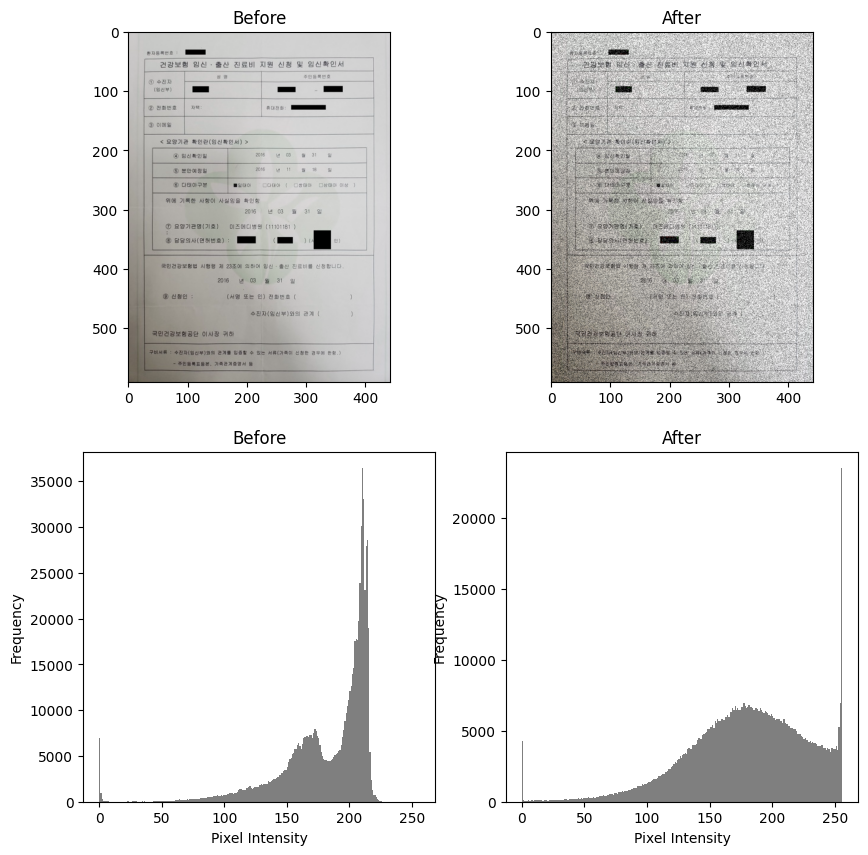

In [6]:
brightness_texturize = BrightnessTexturize(texturize_range=(0.9, 0.99), deviation=0.2)
img_brightness_texturize = brightness_texturize(image)

plt.imshow(img_brightness_texturize)
visualize(image, img_brightness_texturize)

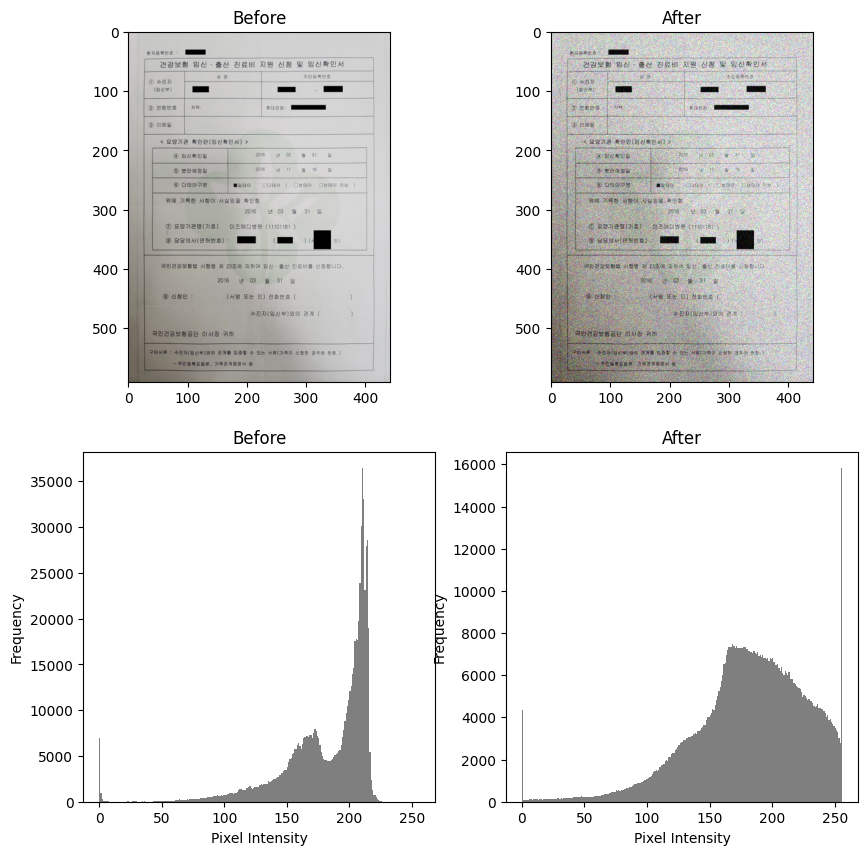

In [47]:
subtle_noise = SubtleNoise(subtle_range=50)

img_subtle_noise = subtle_noise(image)
visualize(image, img_subtle_noise)

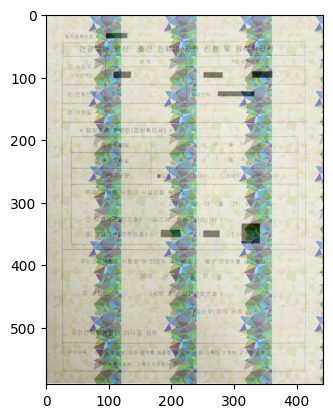

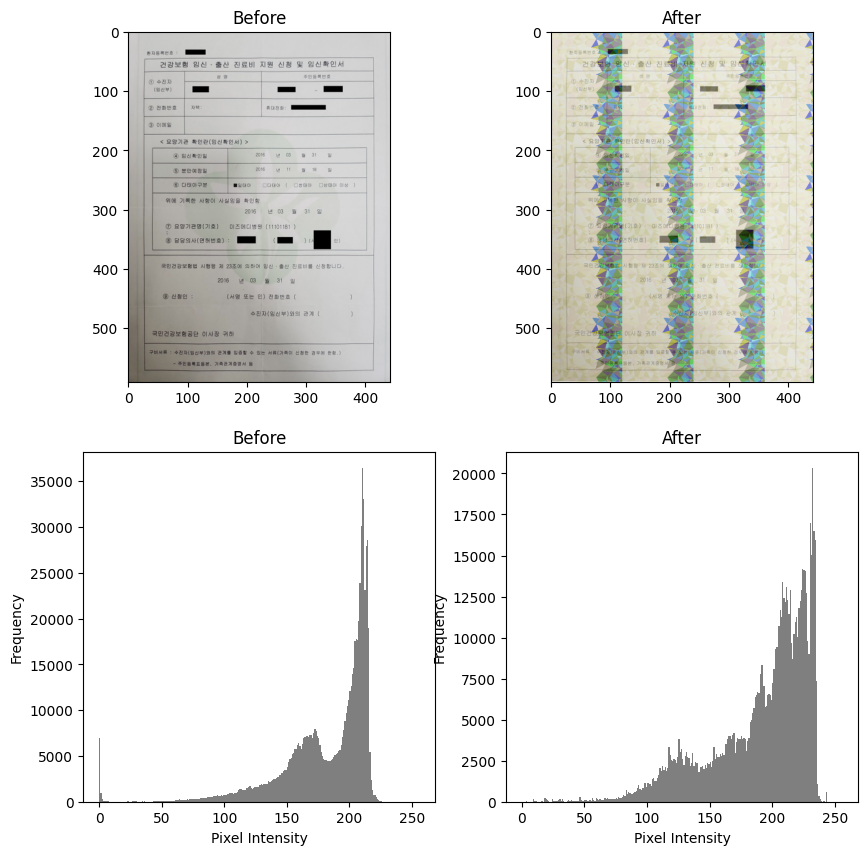

In [7]:
delaunay_pattern = DelaunayTessellation(n_points_range=(500, 800),
                                        n_horizontal_points_range=(50, 100),
                                        n_vertical_points_range=(50, 100),
                                        color_list="random",
                                        noise_type="random")

img_final = delaunay_pattern(image)
plt.imshow(img_final)
visualize(image, img_final)

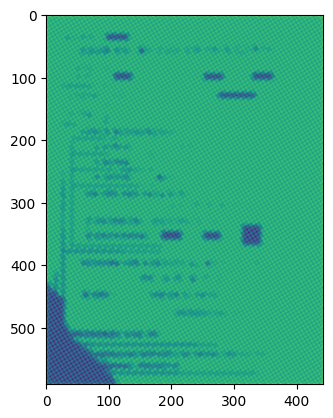

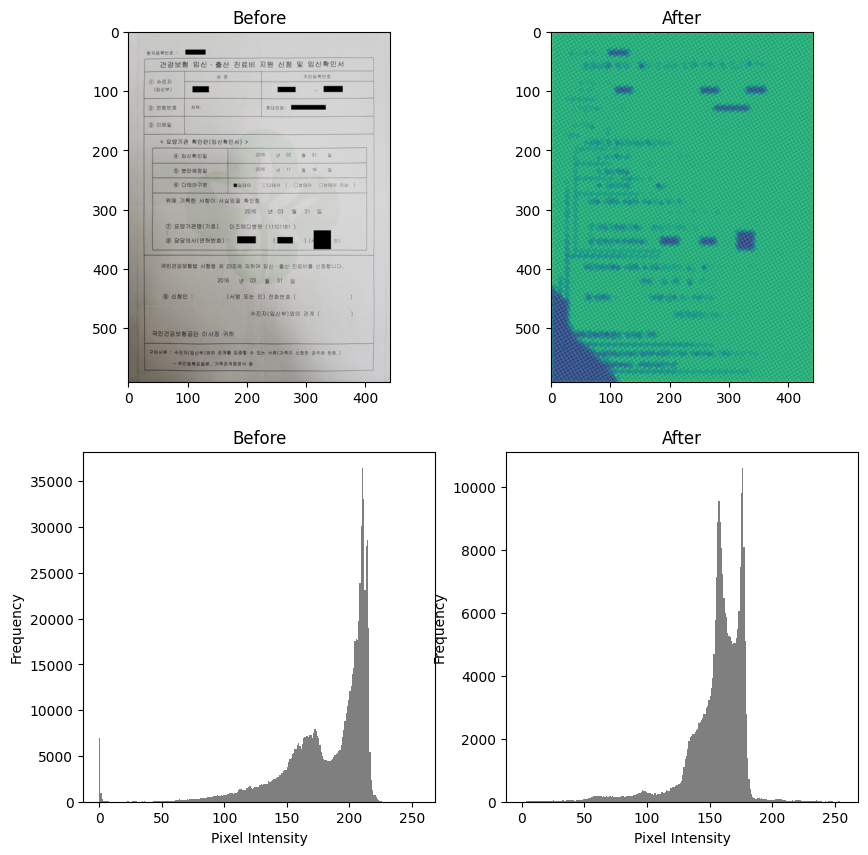

In [8]:
faxify = Faxify(scale_range = (1,2),
                monochrome = 1,
                monochrome_method = "cv2.threshold",
                monochrome_arguments = {"thresh":128, "maxval":128, "type":cv2.THRESH_BINARY},
                halftone = 1,
                invert = 1,
                half_kernel_size = (2,2),
                angle = (0, 360),
                sigma = (1,3))

img_faxify = faxify(image)
plt.imshow(img_faxify)
visualize(image, img_faxify)

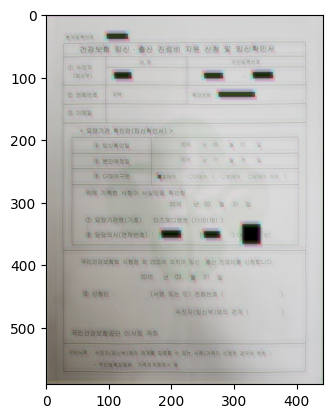

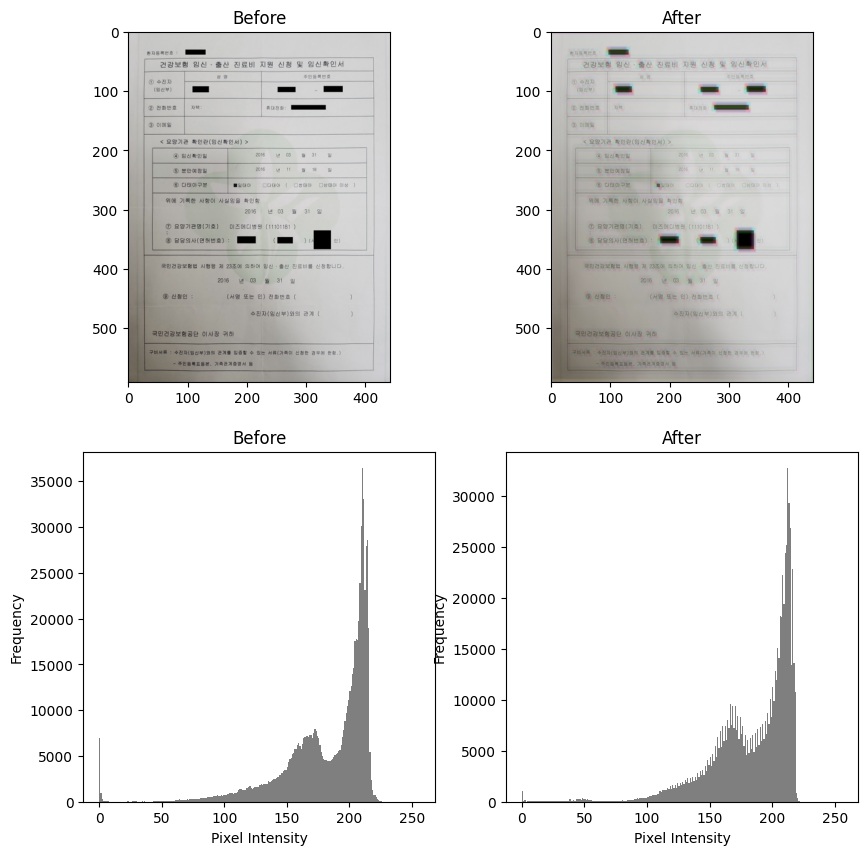

In [9]:
colorshift = ColorShift(color_shift_offset_x_range = (3,5),
                        color_shift_offset_y_range = (3,5),
                        color_shift_iterations = (2,3),
                        color_shift_brightness_range = (0.9,1.1),
                        color_shift_gaussian_kernel_range = (3,3),)

img_colorshift = colorshift(image)
plt.imshow(img_colorshift)
visualize(image, img_colorshift)

In [10]:
# ## 너무 오래 걸려요...
# lensflare = LensFlare(lens_flare_location = "random",
#                       lens_flare_color = "random",
#                       lens_flare_size = (0.5, 5))

# img_lensflare = lensflare(image)
# plt.imshow(img_lensflare)
# visualize(img_lensflare)

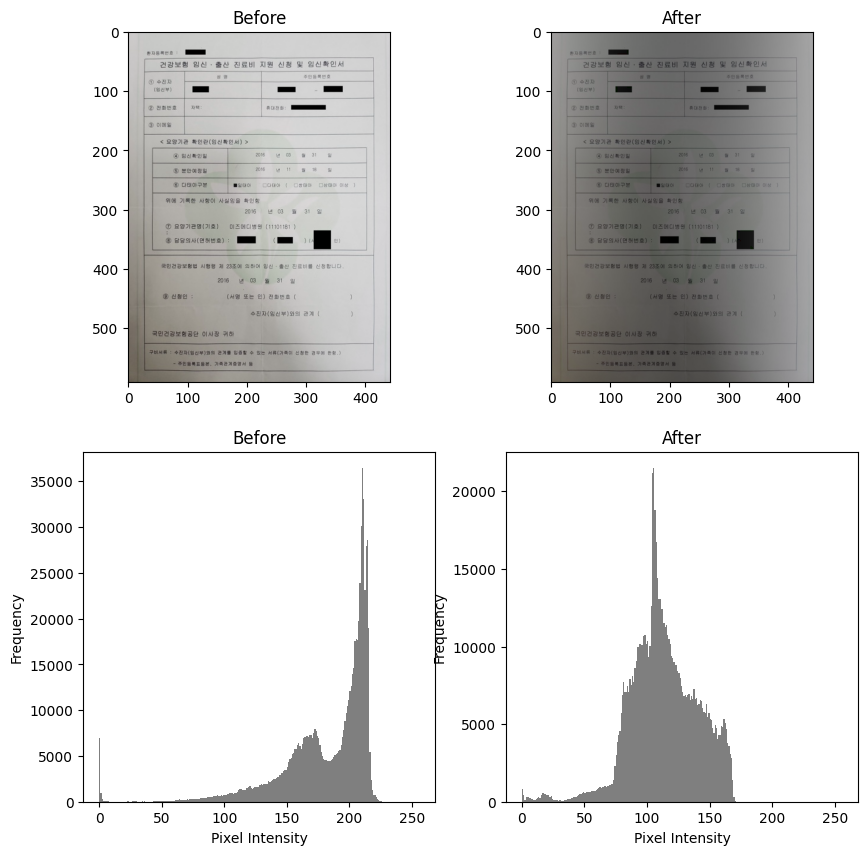

In [17]:
lighting_gradient_gaussian = LightingGradient(light_position=None,
                                              direction=90,
                                              max_brightness=255,
                                              min_brightness=0,
                                              mode="gaussian",
                                              transparency=0.5
                                              )

img_lighting_gradient_gaussian = lighting_gradient_gaussian(image)
visualize(image, img_lighting_gradient_gaussian)

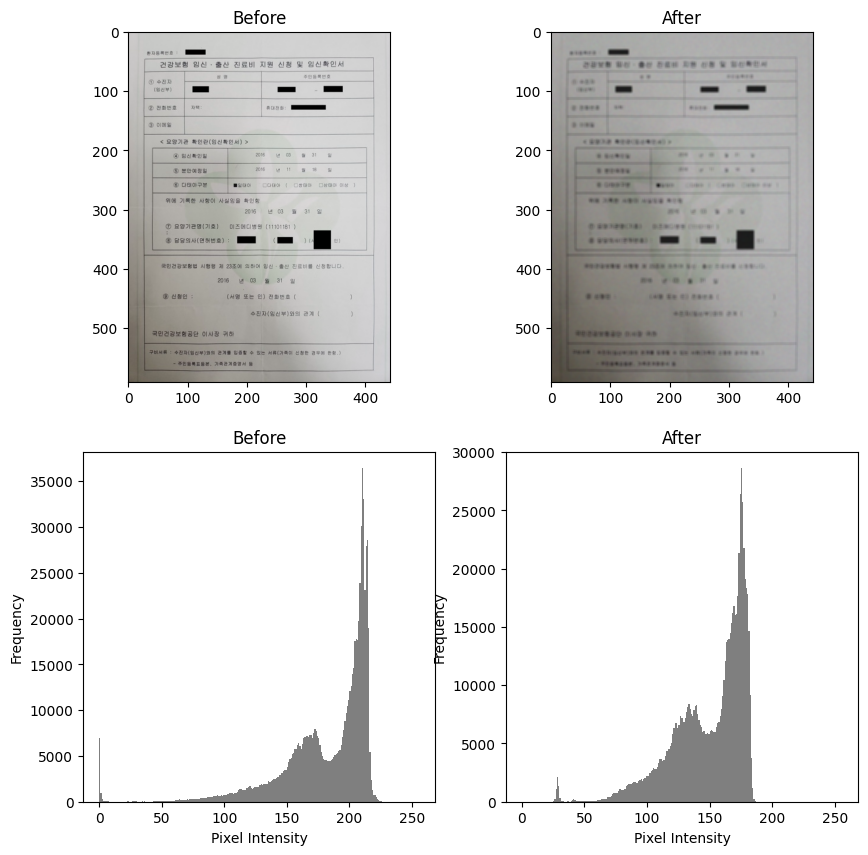

In [18]:
lowlightnoise_obj = LowLightNoise(num_photons_range = (50, 100), alpha_range = (0.7, 0.9), beta_range = (10, 30), gamma_range = (1.0 , 1.8))

lowlightnoise_img = lowlightnoise_obj(image)
visualize(image, lowlightnoise_img)

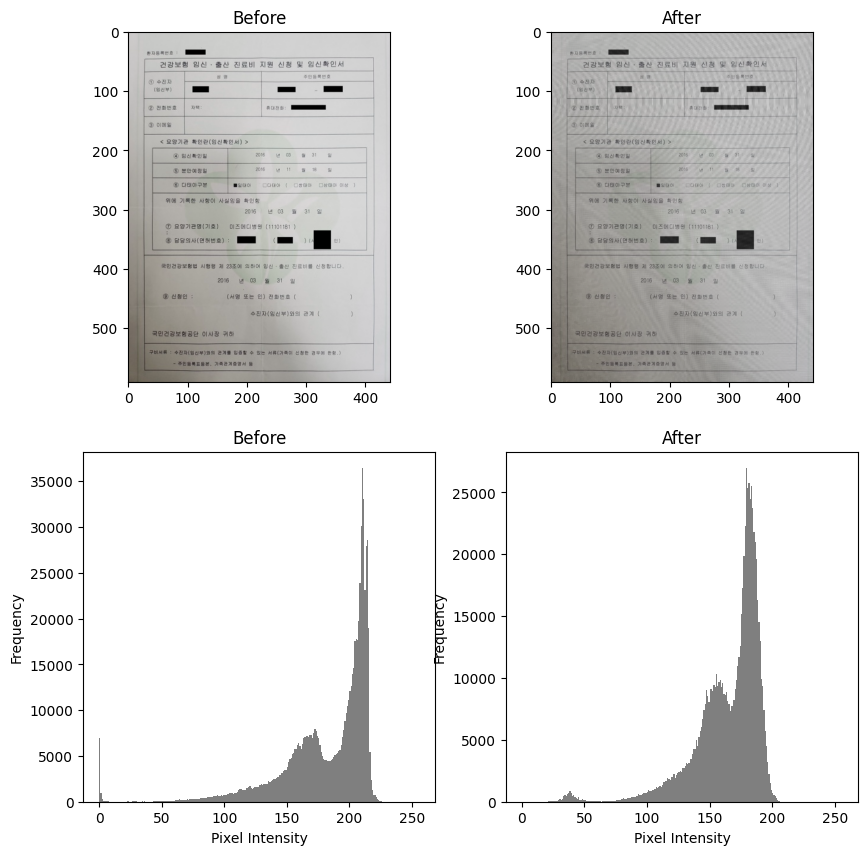

In [19]:
moire = Moire(moire_density = (15,20),
              moire_blend_method = "normal",
              moire_blend_alpha = 0.1,
             )

img_moire = moire(image)
visualize(image, img_moire)

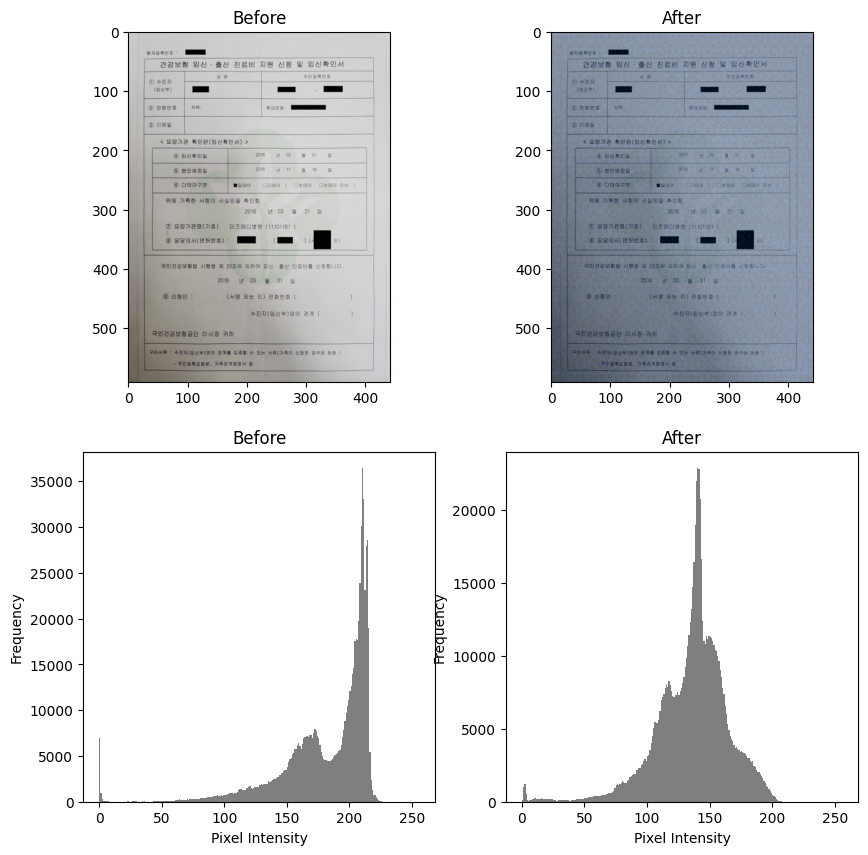

In [35]:
quasi_pattern = PatternGenerator(
    imgx = 512,
    imgy= 512,
    n_rotation_range = (3, 7),
)

img_final = quasi_pattern(image)
visualize(image, img_final)

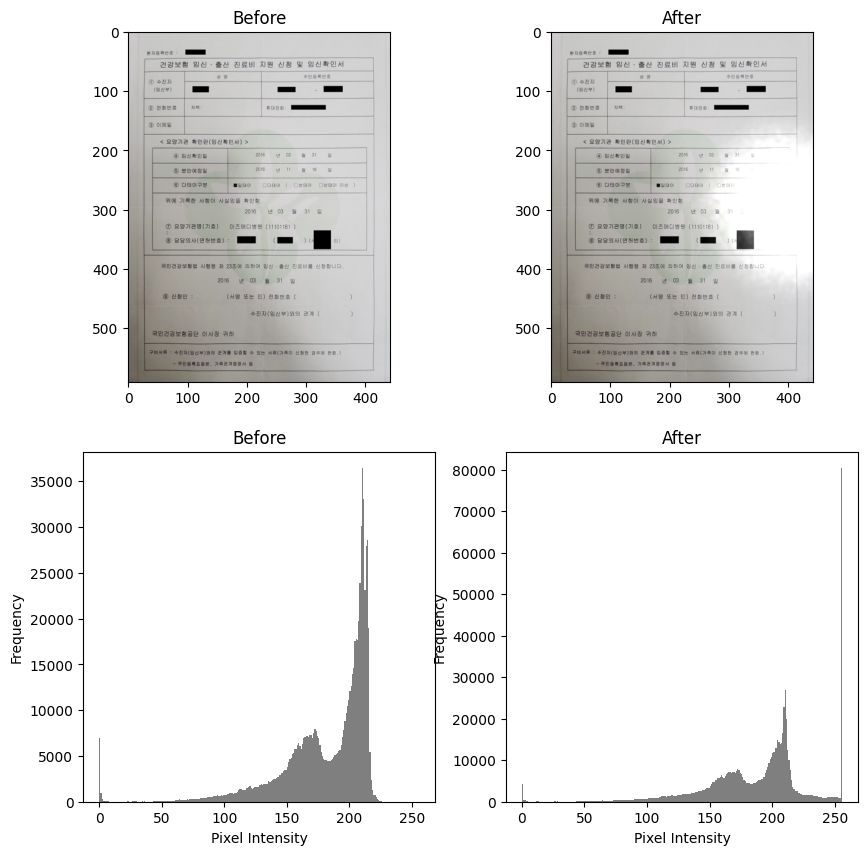

In [44]:
reflected_light = ReflectedLight(reflected_light_smoothness = 0.8,
                                 reflected_light_internal_radius_range=(0.0, 0.2),
                                 reflected_light_external_radius_range=(0.1, 0.8),
                                 reflected_light_minor_major_ratio_range = (0.9, 1.0),
                                 reflected_light_color = (255,255,255),
                                 reflected_light_internal_max_brightness_range=(0.9,1.0),
                                 reflected_light_external_max_brightness_range=(0.9,0.9),
                                 reflected_light_location = "random",
                                 reflected_light_ellipse_angle_range = (0, 360),
                                 reflected_light_gaussian_kernel_size_range = (5,310),
                                 )

img_reflected_light = reflected_light(image)
visualize(image, img_reflected_light)

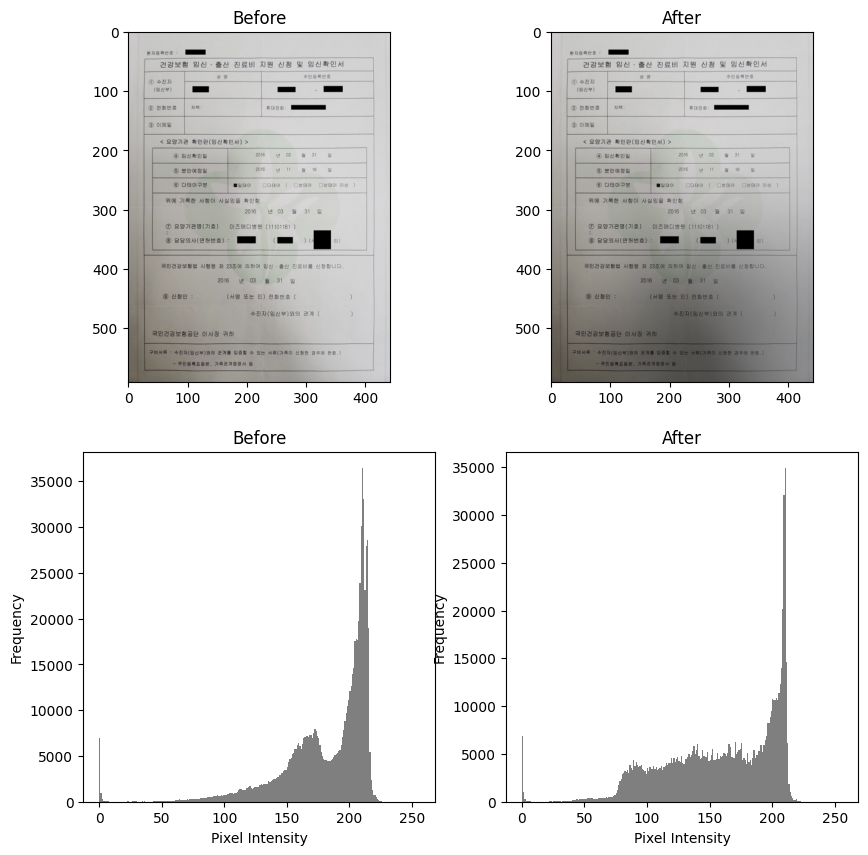

In [45]:
shadowcast = ShadowCast(shadow_side = "bottom",
                        shadow_vertices_range = (2, 3),
                        shadow_width_range=(0.5, 0.8),
                        shadow_height_range=(0.5, 0.8),
                        shadow_color = (0, 0, 0),
                        shadow_opacity_range=(0.5,0.6),
                        shadow_iterations_range = (1,2),
                        shadow_blur_kernel_range = (101, 301))

img_shadowcast = shadowcast(image)
visualize(image, img_shadowcast)

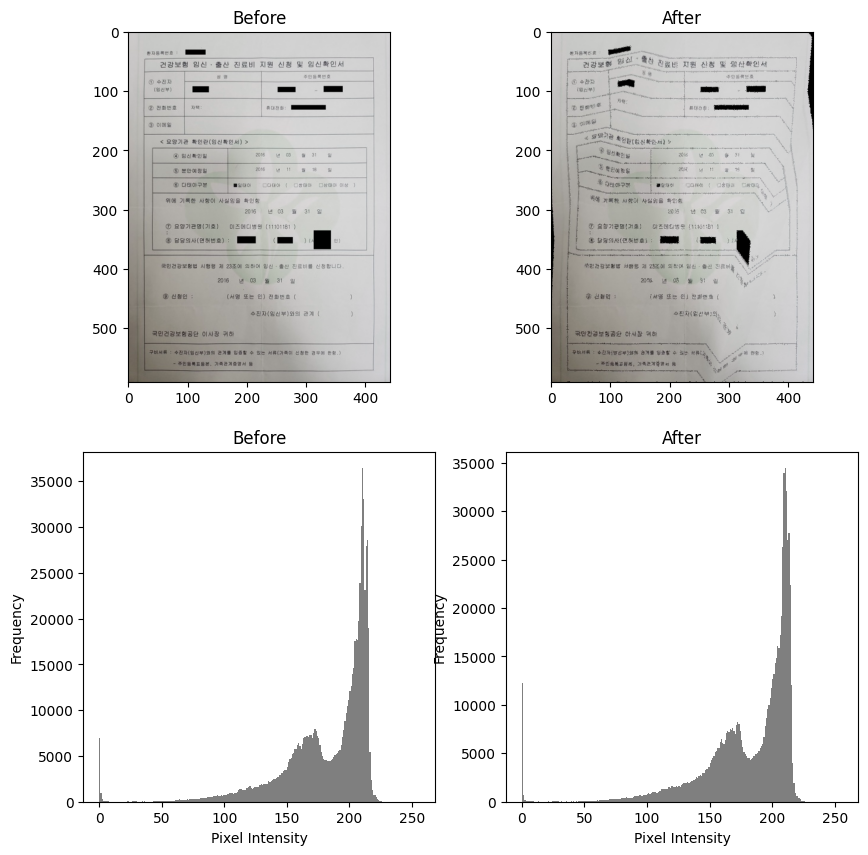

In [51]:
folding = Folding(fold_count=2,
                  fold_noise=0.0,
                  fold_angle_range = (-360,360),
                  gradient_width=(0.1, 0.2),
                  gradient_height=(0.01, 0.1),
                  backdrop_color = (0,0,0),
                  )

img_folded= folding(image)
visualize(image, img_folded)

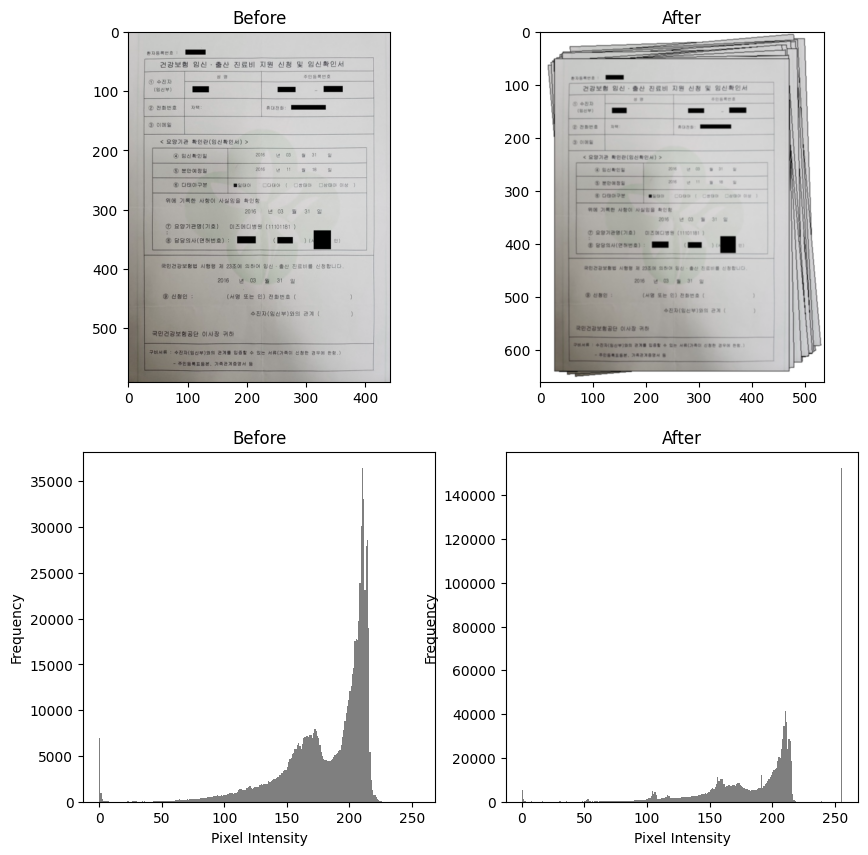

In [54]:
page_border = PageBorder(page_border_width_height = (30, -40),
                         page_border_color=(0, 0, 0),
                         page_border_background_color=(255, 255, 255),
                         page_border_use_cache_images = 0,
                         page_border_trim_sides = (0, 0, 0, 0),
                         page_numbers = 10,
                         page_rotate_angle_in_order = 0,
                         page_rotation_angle_range = (1, 5),
                         curve_frequency=(0, 1),
                         curve_height=(1, 2),
                         curve_length_one_side=(30, 60),
                         same_page_border=0,
                         p=0.5)
img_page_border = page_border(image)
visualize(image, img_page_border)

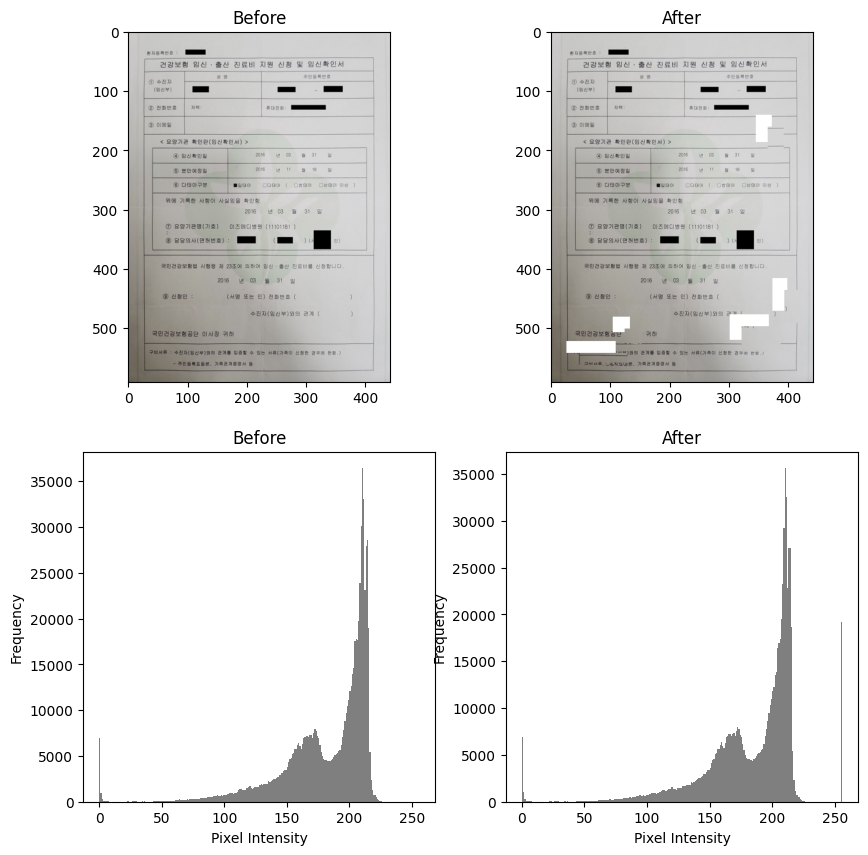

In [68]:
sectionshift = SectionShift(section_shift_number_range = (5,5),
                            section_shift_locations = "random",
                            section_shift_x_range = (20,20),
                            section_shift_y_range = (20,20),
                            section_shift_fill_value = (255,255,255))

img_sectionshift = sectionshift(image)
visualize(image, img_sectionshift)

In [69]:
rescale = Rescale(target_dpi=300)

pipeline1 = AugraphyPipeline(pre_phase=[rescale], ink_phase=[InkBleed()], paper_phase=[ColorPaper()], post_phase=[BleedThrough()], fixed_dpi=1)
pipeline2 = AugraphyPipeline(pre_phase=[rescale], ink_phase=[InkBleed()], paper_phase=[ColorPaper()], post_phase=[BleedThrough()], fixed_dpi=0)

img_rescale1 = pipeline1(image)
img_rescale2 = pipeline2(image)

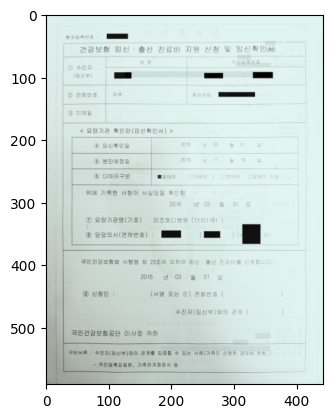

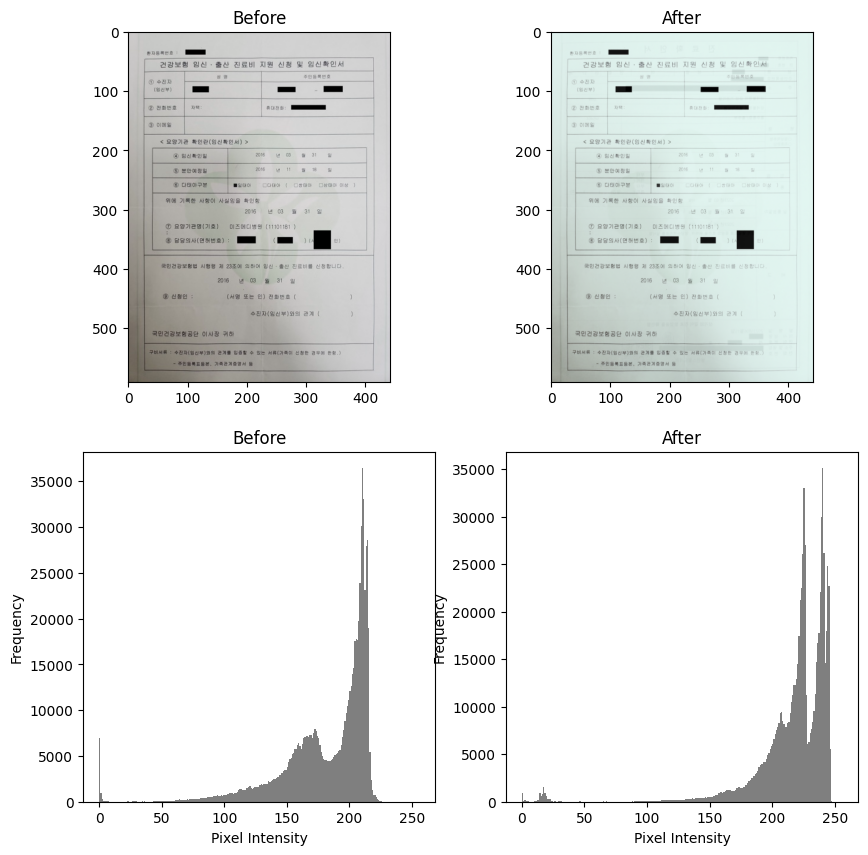

In [70]:
plt.imshow(img_rescale1)
visualize(image, img_rescale1)

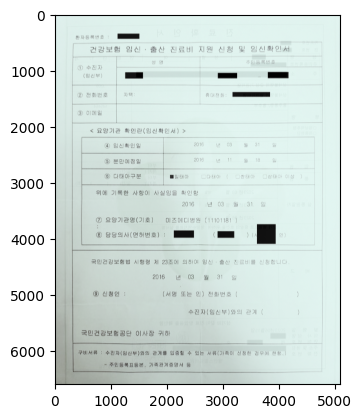

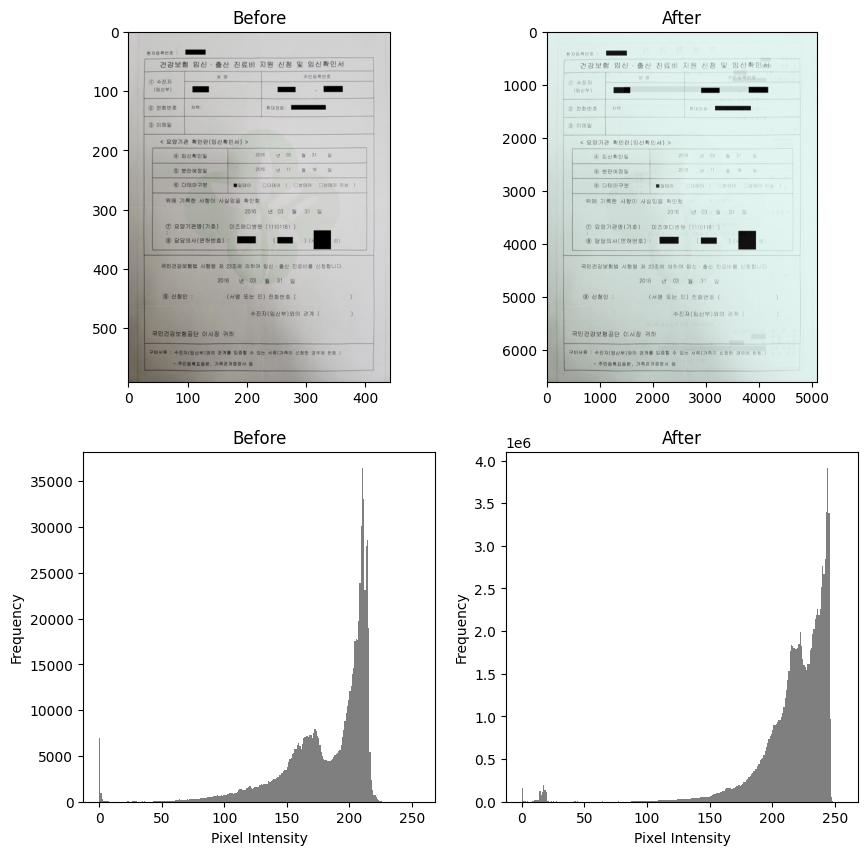

In [71]:
plt.imshow(img_rescale2)
visualize(image, img_rescale2)

# Ink

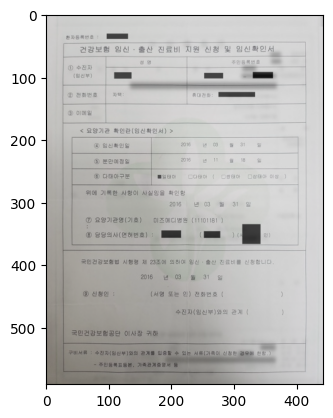

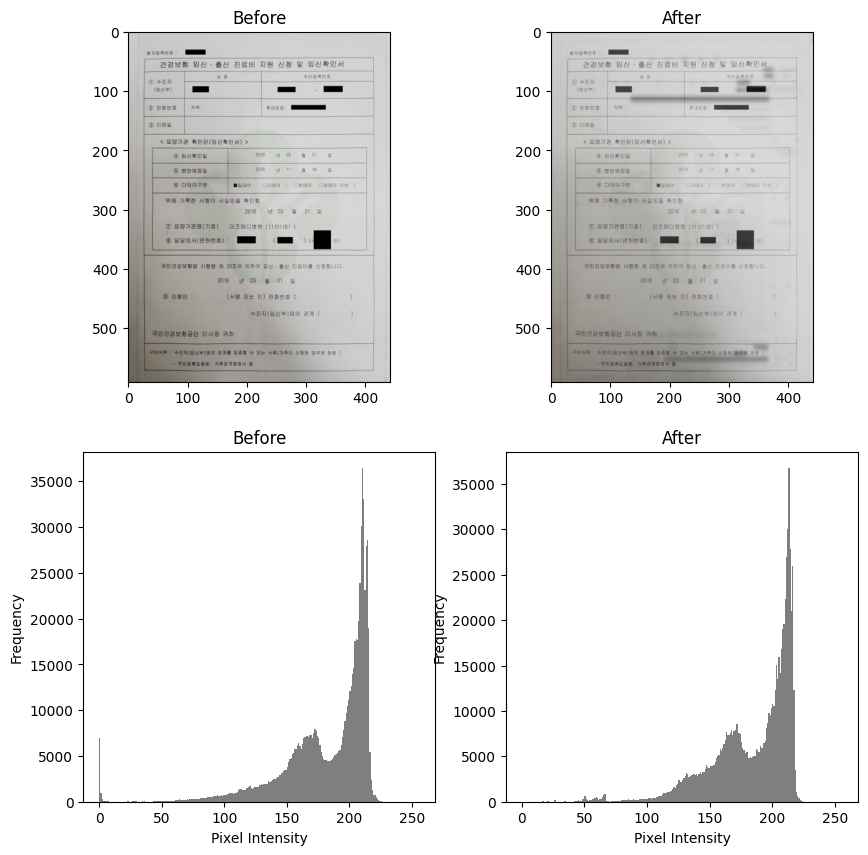

In [67]:
bleedthrough = BleedThrough(intensity_range=(0.1, 0.2),
                            color_range=(0, 224),
                            ksize=(17, 17),
                            sigmaX=0,
                            alpha=0.3,
                            offsets=(10, 20),
                        )

img_bleedthrough = bleedthrough(image)
plt.imshow(img_bleedthrough)
visualize(image, img_bleedthrough)

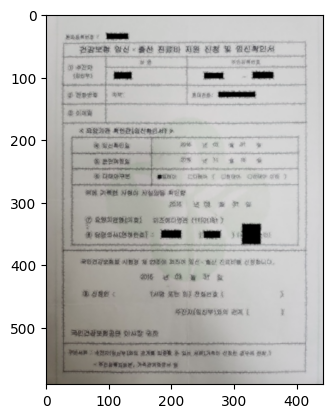

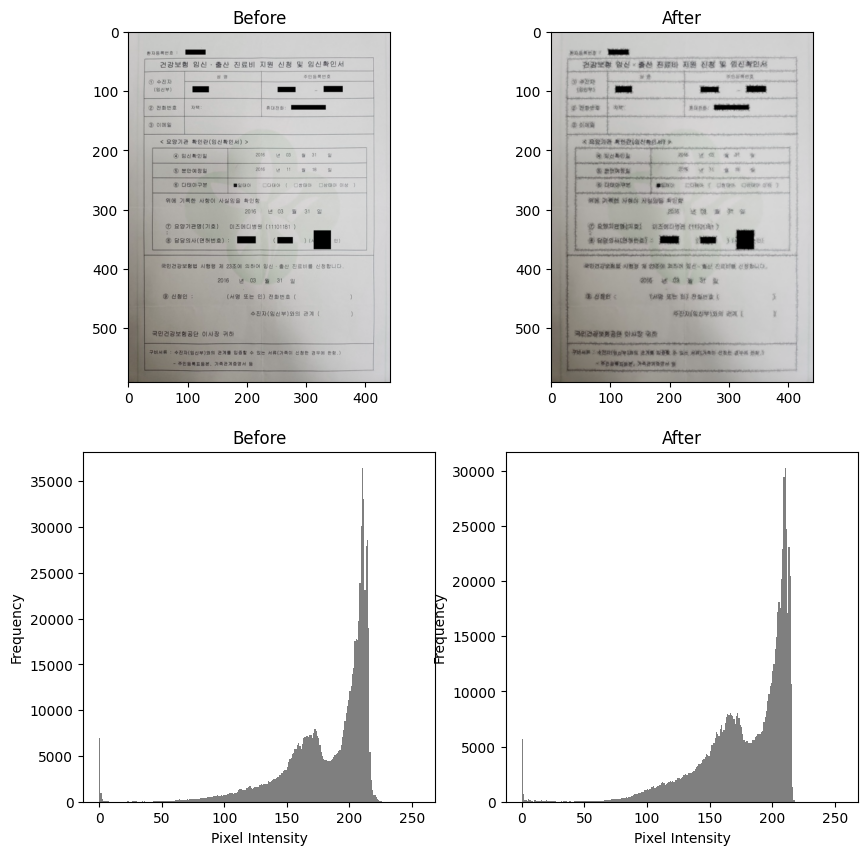

In [11]:
inkbleed = InkBleed(intensity_range=(0.4, 0.7),
                    kernel_size=(5, 5),
                    severity=(0.2, 0.4)
                    )

img_inkbleed = inkbleed(image)

plt.imshow(img_inkbleed)
visualize(image, img_inkbleed)

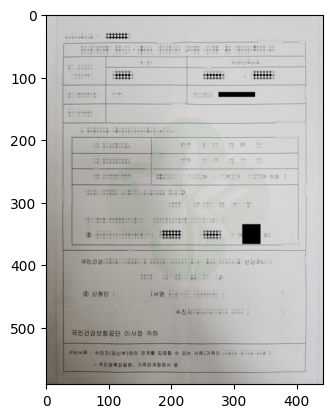

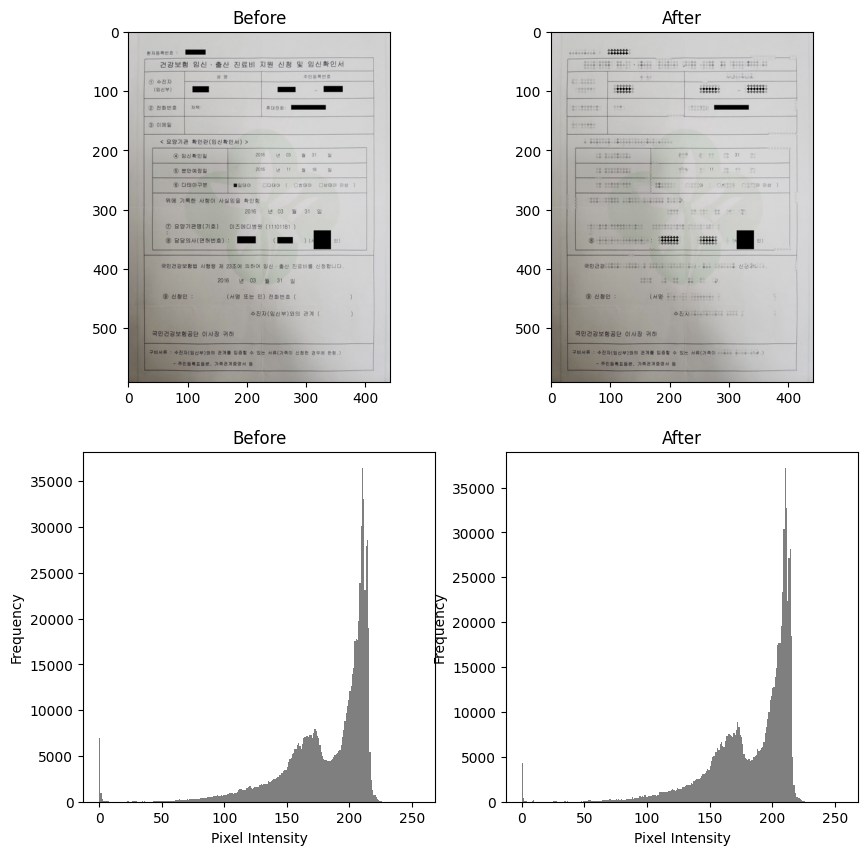

In [12]:
dotmatrix = DotMatrix(dot_matrix_shape="circle",
                      dot_matrix_dot_width_range=(5, 5),
                      dot_matrix_dot_height_range=(5, 5),
                      dot_matrix_min_width_range=(1, 1),
                      dot_matrix_max_width_range=(50, 50),
                      dot_matrix_min_height_range=(1, 1),
                      dot_matrix_max_height_range=(50, 50),
                      dot_matrix_min_area_range=(10, 10),
                      dot_matrix_max_area_range=(800, 800),
                      dot_matrix_median_kernel_value_range = (29,29),
                      dot_matrix_gaussian_kernel_value_range=(1, 1),
                      dot_matrix_rotate_value_range=(0, 0))

img_dotmatrix = dotmatrix(image)

plt.imshow(img_dotmatrix)
visualize(image, img_dotmatrix)

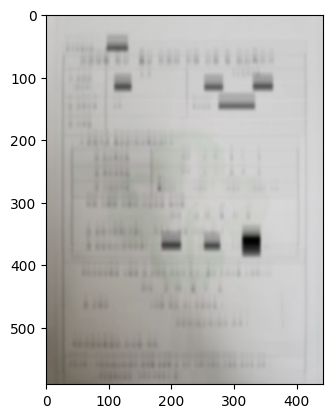

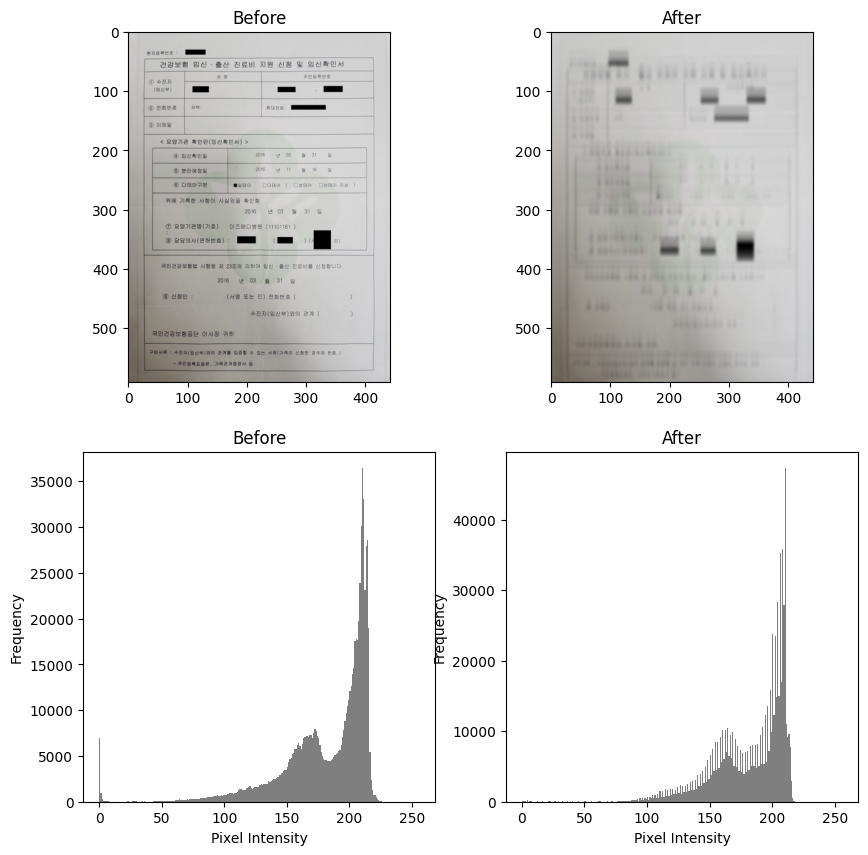

In [13]:
doubleexposure = DoubleExposure(gaussian_kernel_range=(9,12), offset_direction=1, offset_range=(18,25))
img_doubleexposure = doubleexposure(image)

plt.imshow(img_doubleexposure)
visualize(image, img_doubleexposure)

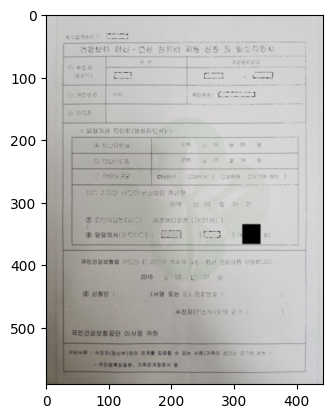

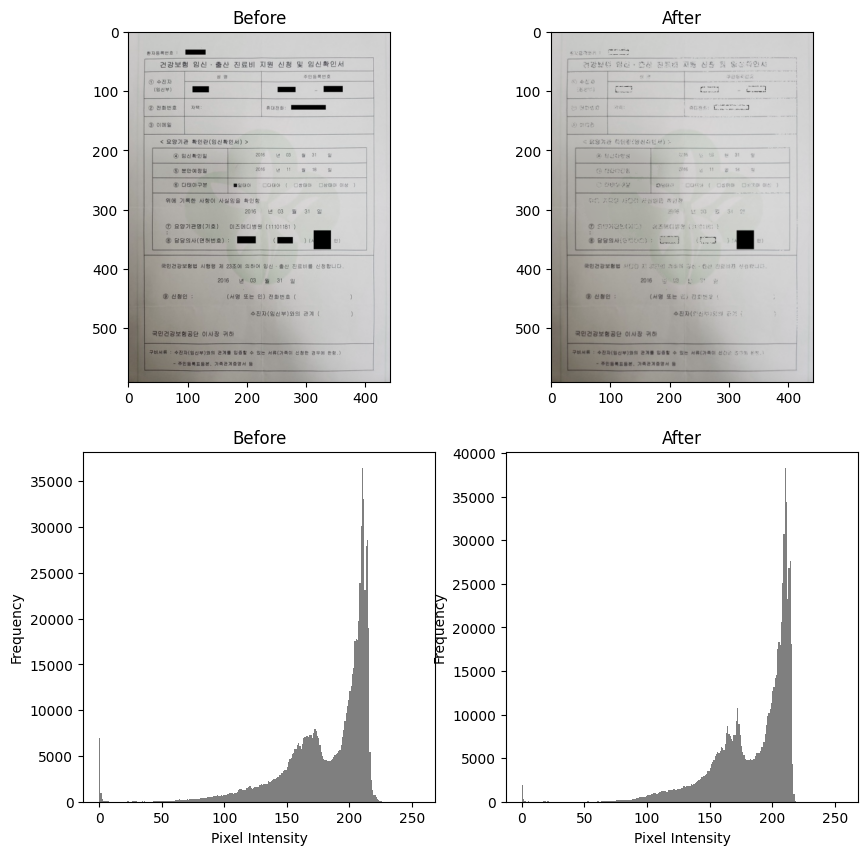

In [14]:
hollow = Hollow(hollow_median_kernel_value_range = (101, 101),
                hollow_min_width_range=(1, 1),
                hollow_max_width_range=(200, 200),
                hollow_min_height_range=(1, 1),
                hollow_max_height_range=(200, 200),
                hollow_min_area_range=(10, 10),
                hollow_max_area_range=(5000, 5000),
                hollow_dilation_kernel_size_range = (3, 3),
                )

img_hollow= hollow(image)
plt.imshow(img_hollow)
visualize(image, img_hollow)

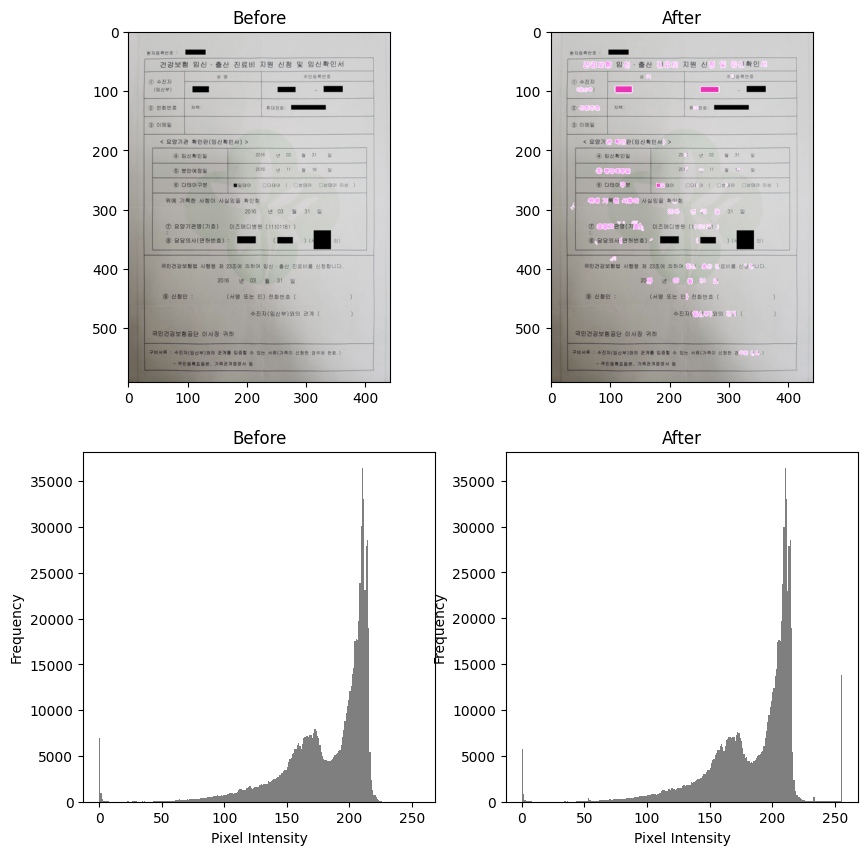

In [15]:
inkcolorswap= InkColorSwap(ink_swap_color = "random",
                           ink_swap_sequence_number_range = (1,10),
                           ink_swap_min_width_range=(3,3),
                           ink_swap_max_width_range=(100,100),
                           ink_swap_min_height_range=(3,3),
                           ink_swap_max_height_range=(100,100),
                           ink_swap_min_area_range=(10,10),
                           ink_swap_max_area_range=(400,400))

img_inkcolorswap = inkcolorswap(image)
visualize(image, img_inkcolorswap)

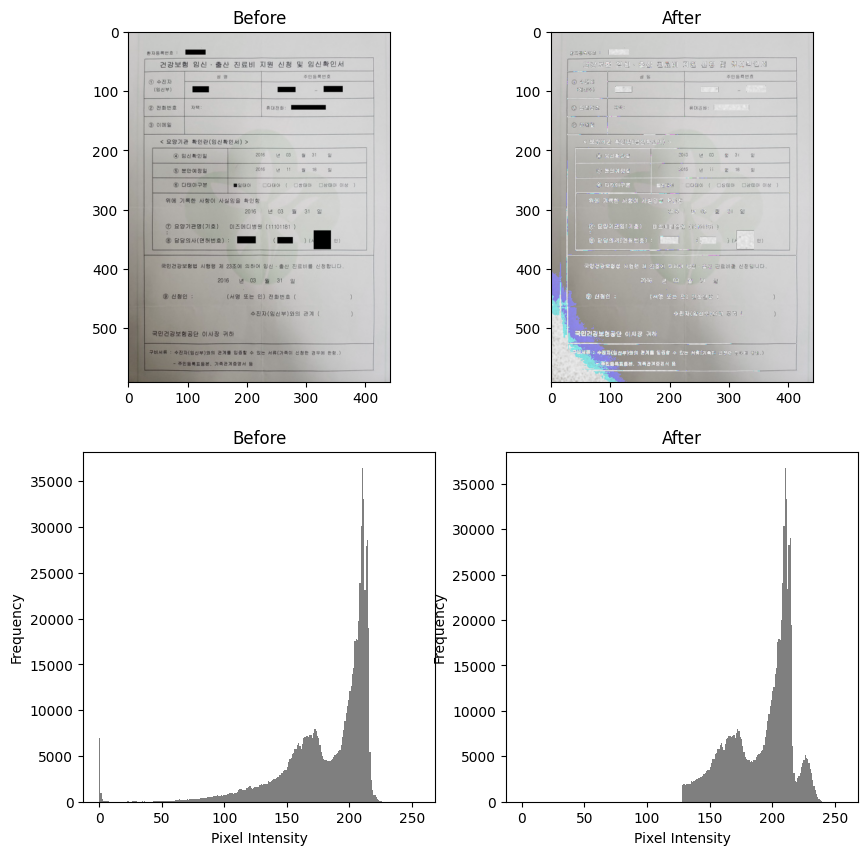

In [16]:
letterpress = Letterpress(n_samples=(200, 500),
                          n_clusters=(300, 800),
                          std_range=(1500, 5000),
                          value_range=(200, 255),
                          value_threshold_range=(128, 128),
                          blur=1
                          )

img_letterpress = letterpress(image)

visualize(image, img_letterpress)

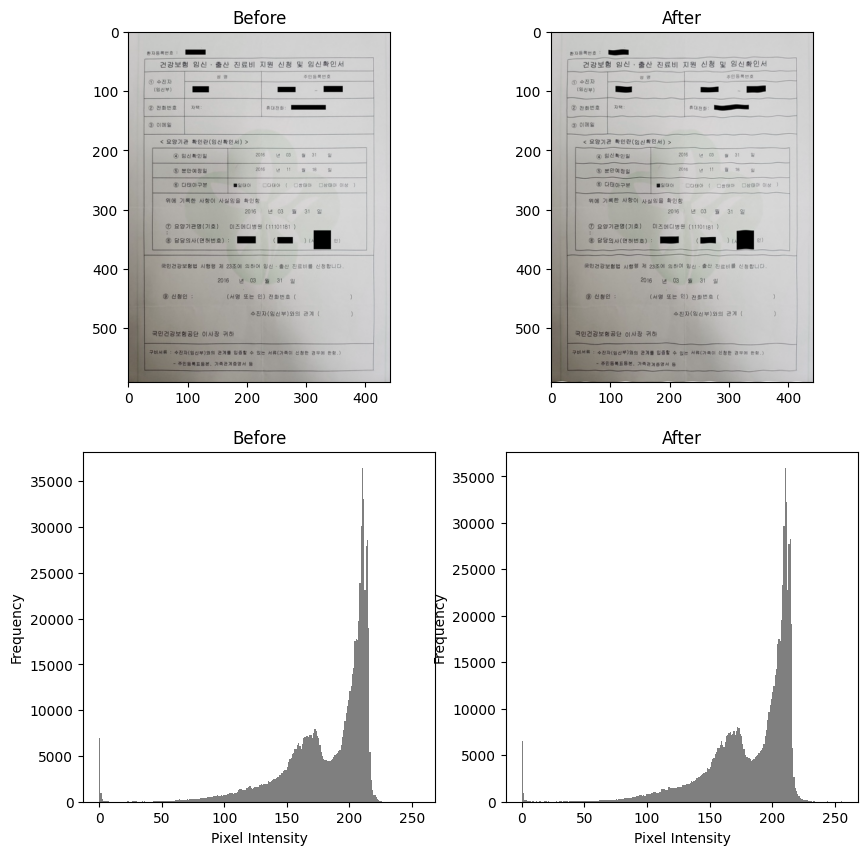

In [53]:
inkshifter_obj = InkShifter(
    text_shift_scale_range=(18, 27),
    text_shift_factor_range=(1, 4),
    text_fade_range=(0, 2),
    noise_type = "random",
)

inkshifter_img = inkshifter_obj(image)
visualize(image, inkshifter_img)